In [1]:
import pandas as pd
import numpy as np

In [6]:
JUMPCP_compounds = pd.read_csv("../data/processed/JUMPCP_compounds/JUMPCP_compounds_processed.csv.gz", compression="gzip")
JUMPCP_compounds = JUMPCP_compounds.drop_duplicates(subset="Standardized_SMILES", keep="first")
df = JUMPCP_compounds.drop_duplicates(subset="Standardized_InChI", keep="first").reset_index(drop=True)
df

,Metadata_JCP2022,smiles,Standardized_SMILES,Standardized_InChI
0,JCP2022_000001,CCc1nccn1-c1cccc(C2CCCN2C(=O)c2ccc(OCCN(C)C)cc...,CCc1nccn1-c1cccc(C2CCC[NH+]2C(=O)c2ccc(OCC[NH+...,InChI=1S/C25H31N5O2/c1-4-23-26-14-16-30(23)24-...
1,JCP2022_000002,OC1=NCCCN1Cc1ccc(Cl)cc1,O=C1NCCC[NH+]1Cc1ccc(Cl)cc1,InChI=1S/C11H13ClN2O/c12-10-4-2-9(3-5-10)8-14-...
2,JCP2022_000003,O=C1N=C(O)c2cc(Nc3ccccc3)c(Nc3ccccc3)cc21,O=C1NC(=O)c2cc(Nc3ccccc3)c(Nc3ccccc3)cc21,InChI=1S/C20H15N3O2/c24-19-15-11-17(21-13-7-3-...
3,JCP2022_000004,CCCn1nccc1S(=O)(=O)N1CC2CCC1CNC2,CCCn1nccc1S(=O)(=O)[NH+]1CC2CCC1C[NH2+]C2,InChI=1S/C13H22N4O2S/c1-2-7-16-13(5-6-15-16)20...
4,JCP2022_000005,CCN=C(O)CC1N=C(c2ccc(Cl)cc2)c2cc(OC)ccc2-n2c(C...,CCNC(=O)CC1N=C(c2ccc(Cl)cc2)c2cc(OC)ccc2-n2c(C...,InChI=1S/C22H22ClN5O2/c1-4-24-20(29)12-18-22-2...
...,...,...,...,...
116717,JCP2022_116749,CN(C)c1ccc(O)c2c1CC1CC3C(N(C)C)C(=O)C(C(=N)O)C...,CN(C)c1ccc([O-])c2c1CC1CC3C([NH+](C)C)C(=O)C(C...,InChI=1S/C23H27N3O7/c1-25(2)12-5-6-13(27)15-10...
116718,JCP2022_116750,Cc1nc(C)c(CCC(=O)N(C2CC2)C2CCCc3ccccc32)c(O)n1,Cc1nc(=O)c(CCC(=O)[NH+](C2CC2)C2CCCc3ccccc32)c...,InChI=1S/C22H27N3O2/c1-14-18(22(27)24-15(2)23-...
116719,JCP2022_116751,Cn1ccc2ccn(CCN=C(O)c3cnc4ccccc4n3)c(=O)c21,Cn1ccc2ccn(CCNC(=O)c3cnc4ccccc4n3)c(=O)c21,InChI=1S/C19H17N5O2/c1-23-9-6-13-7-10-24(19(26...
116720,JCP2022_116752,Cc1nccc(-c2cccc(NS(=O)(=O)c3cc(C(F)(F)F)cc(C(F...,Cc1nccc(-c2cccc(NS(=O)(=O)c3cc(C(F)(F)F)cc(C(F...,InChI=1S/C19H13F6N3O2S/c1-11-26-6-5-17(27-11)1...


In [21]:
from rdkit import Chem, DataStructs
from rdkit.Chem import Descriptors,Crippen

def GetExactMolWt(s):
    mol = Chem.MolFromSmiles(s)
    return (Descriptors.ExactMolWt (mol))
def GetCalcTPSA(s):
    mol = Chem.MolFromSmiles(s)
    return (Chem.rdMolDescriptors.CalcTPSA(mol))
def GetNumRotatableBonds(s):
    mol = Chem.MolFromSmiles(s)
    return (Descriptors.NumRotatableBonds (mol))
def GetNumHDonors(s):
    mol = Chem.MolFromSmiles(s)
    return (Descriptors.NumHDonors(mol))
def GetNumHAcceptors(s):
    mol = Chem.MolFromSmiles(s)
    return (Descriptors.NumHAcceptors(mol) )
def GetMolLogP(s):
    mol = Chem.MolFromSmiles(s)
    return (Descriptors.MolLogP(mol))

In [22]:
from pandarallel import pandarallel
pandarallel.initialize(progress_bar=True)

INFO: Pandarallel will run on 76 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


In [23]:
df['MolWt']=df['Standardized_SMILES'].parallel_apply(GetExactMolWt)
df['TPSA']=df['Standardized_SMILES'].parallel_apply(GetCalcTPSA) #Topological Polar Surface Area
df['nRotB']=df['Standardized_SMILES'].parallel_apply(GetNumRotatableBonds) #Number of rotable bonds
df['HBD']=df['Standardized_SMILES'].parallel_apply(GetNumHDonors) #Number of H bond donors
df['HBA']=df['Standardized_SMILES'].parallel_apply(GetNumHAcceptors) #Number of H bond acceptors
df['LogP']=df['Standardized_SMILES'].parallel_apply(GetMolLogP) #LogP

In [24]:
from rdkit import Chem
from mordred import Calculator, descriptors

#create descriptor calculator with all descriptors
calc = Calculator(descriptors, ignore_3D=True)

print(len(calc.descriptors))

Ser_Mol = df['Standardized_SMILES'].apply(Chem.MolFromSmiles)


1613


In [25]:
pandarallel.initialize(progress_bar = True)
Mordred_table=  calc.pandas(Ser_Mol)

INFO: Pandarallel will run on 76 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


  0%|                                     | 221/116722 [00:01<06:25, 301.85it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  1%|▏                                    | 694/116722 [00:02<07:01, 275.17it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  1%|▎                                    | 864/116722 [00:03<05:29, 351.32it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  2%|▌                                   | 1850/116722 [00:06<04:14, 452.16it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  2%|▋                                   | 2036/116722 [00:06<05:44, 332.65it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  3%|▉                                   | 2969/116722 [00:09<05:23, 351.62it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  3%|█▏                                  | 3733/116722 [00:11<07:07, 264.14it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  4%|█▍                                  | 4567/116722 [00:14<05:19, 351.41it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  5%|█▋                                  | 5301/116722 [00:18<11:54, 155.91it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  5%|█▊                                  | 6011/116722 [00:21<08:23, 220.00it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  5%|█▉                                  | 6374/116722 [00:23<07:40, 239.42it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  6%|█▉                                  | 6482/116722 [00:23<07:00, 262.41it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  6%|██                                  | 6606/116722 [00:23<06:02, 304.02it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  6%|██                                  | 6875/116722 [00:24<03:57, 462.13it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  6%|██▏                                 | 7202/116722 [00:25<04:10, 436.36it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  7%|██▍                                 | 7951/116722 [00:27<04:09, 435.93it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  8%|██▊                                 | 9026/116722 [00:31<04:33, 394.46it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  9%|███▎                               | 10875/116722 [00:38<05:22, 328.19it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 11%|███▉                               | 13054/116722 [00:44<03:30, 491.80it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 12%|████                               | 13727/116722 [00:48<04:52, 352.16it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 12%|████▎                              | 14501/116722 [00:50<05:28, 311.52it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 14%|████▉                              | 16375/116722 [00:55<03:58, 420.00it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 15%|█████▏                             | 17282/116722 [01:01<04:11, 396.10it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 16%|█████▌                             | 18484/116722 [01:04<03:13, 507.40it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 18%|██████▍                             | 20678/116722 [01:13<17:09, 93.28it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 18%|██████▎                            | 21156/116722 [01:14<05:24, 294.62it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 20%|███████                            | 23538/116722 [01:20<04:07, 376.94it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 20%|███████▏                           | 23766/116722 [01:20<03:58, 390.08it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 22%|███████▌                           | 25148/116722 [01:24<04:00, 380.67it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 22%|███████▌                           | 25230/116722 [01:24<06:08, 248.39it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 23%|████████▏                          | 27411/116722 [01:34<05:42, 260.88it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 25%|████████▋                          | 28978/116722 [01:38<04:23, 332.87it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 25%|████████▊                          | 29476/116722 [01:40<03:24, 425.80it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 26%|████████▉                          | 29837/116722 [01:41<04:12, 343.72it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 26%|█████████                          | 30022/116722 [01:42<04:18, 335.06it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 27%|█████████▌                         | 31777/116722 [01:47<03:46, 375.55it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 28%|█████████▊                         | 32666/116722 [01:54<07:17, 192.33it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 28%|█████████▊                         | 32875/116722 [01:55<05:02, 277.29it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 30%|██████████▋                        | 35529/116722 [02:01<02:54, 464.35it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 32%|███████████▎                       | 37756/116722 [02:07<02:50, 462.06it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 33%|███████████▌                       | 38405/116722 [02:10<04:16, 305.11it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 33%|███████████▌                       | 38754/116722 [02:11<03:25, 379.94it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 33%|███████████▋                       | 39038/116722 [02:11<04:33, 284.14it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 34%|███████████▊                       | 39410/116722 [02:12<03:41, 348.43it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 34%|███████████▉                       | 39790/116722 [02:13<02:46, 461.45it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 34%|███████████▉                       | 39981/116722 [02:14<03:03, 419.21it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 35%|████████████▏                      | 40606/116722 [02:25<06:26, 197.10it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 36%|████████████▊                      | 42571/116722 [02:30<03:01, 408.27it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 40%|█████████████▊                     | 46154/116722 [02:40<02:47, 422.51it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 45%|███████████████▉                   | 53000/116722 [03:09<02:55, 363.12it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 47%|████████████████▌                  | 55087/116722 [03:14<01:59, 515.14it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 48%|████████████████▊                  | 56015/116722 [03:17<02:57, 342.23it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 50%|█████████████████▌                 | 58651/116722 [03:23<02:17, 421.30it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 52%|██████████████████▎                | 60994/116722 [03:30<03:32, 261.85it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 57%|████████████████████               | 66860/116722 [04:00<02:12, 375.48it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 60%|█████████████████████              | 70360/116722 [04:10<02:00, 383.40it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 61%|█████████████████████▏             | 70766/116722 [04:11<01:42, 446.40it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 68%|███████████████████████▋           | 78920/116722 [04:49<02:41, 234.75it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 69%|████████████████████████           | 80382/116722 [04:52<01:33, 389.03it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 83%|█████████████████████████████▏     | 97389/116722 [05:51<00:43, 446.90it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 85%|█████████████████████████████▋     | 98968/116722 [05:56<01:01, 288.17it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 96%|████████████████████████████████▊ | 112595/116722 [06:33<00:15, 259.99it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 97%|████████████████████████████████▊ | 112856/116722 [06:33<00:09, 421.36it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 98%|█████████████████████████████████▏| 114126/116722 [06:37<00:06, 417.71it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


100%|██████████████████████████████████| 116722/116722 [06:52<00:00, 282.72it/s]


In [26]:
Mordred_table 

,ABC,ABCGG,nAcid,nBase,SpAbs_A,SpMax_A,SpDiam_A,SpAD_A,SpMAD_A,LogEE_A,...,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,24.834266,19.576250,0,2,41.754673,2.451080,4.835478,41.754673,1.304834,4.393306,...,10.285718,83.455755,435.262328,6.696344,3322,48,166.0,195.0,9.611111,7.166667
1,11.492048,9.643032,0,1,19.325025,2.295713,4.591427,19.325025,1.288335,3.626969,...,9.365034,46.630856,225.078917,7.761342,388,19,74.0,83.0,4.694444,3.361111
2,19.856009,15.606396,0,0,33.217898,2.488053,4.888167,33.217898,1.328716,4.165361,...,10.130504,74.134426,329.116427,8.227911,1468,38,134.0,158.0,6.638889,5.444444
3,15.670087,14.074278,0,2,25.772484,2.502045,4.946303,25.772484,1.288624,3.941918,...,10.051261,68.287498,300.160900,6.821839,742,36,108.0,130.0,6.368056,4.388889
4,23.379612,18.956141,0,0,38.855842,2.542122,4.964726,38.855842,1.295195,4.337099,...,10.369326,80.170869,423.146203,8.137427,2204,54,160.0,192.0,9.722222,6.694444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116717,26.067060,21.457796,1,1,40.137325,2.651875,5.303750,40.137325,1.216283,4.443841,...,10.938148,70.433553,457.184900,7.619748,2672,75,188.0,239.0,14.840278,6.972222
116718,21.367682,17.138865,1,1,34.932509,2.482824,4.911432,34.932509,1.293797,4.258685,...,10.330094,80.928598,365.210327,6.763154,1865,45,146.0,175.0,8.361111,5.861111
116719,20.591625,15.696032,0,0,34.533967,2.454100,4.830136,34.533967,1.328229,4.203596,...,10.234911,75.168832,347.138225,8.072982,1890,42,140.0,167.0,7.500000,5.666667
116720,24.489994,19.648264,0,0,37.073862,2.469485,4.938970,37.073862,1.195931,4.359595,...,10.478892,67.257838,461.063267,10.478711,2724,50,168.0,194.0,12.965278,6.319444


In [28]:
# Identify columns with <117 unique values (not unique to 0.1% dataset)
binary_integer_cols = [col for col in Mordred_table.columns if Mordred_table[col].nunique() <= 117]
# Drop the identified columns
filtered_Mordred_table = Mordred_table.drop(columns=binary_integer_cols)
filtered_Mordred_table

,ABC,ABCGG,SpAbs_A,SpMax_A,SpDiam_A,SpAD_A,SpMAD_A,LogEE_A,VE1_A,VE2_A,...,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,24.834266,19.576250,41.754673,2.451080,4.835478,41.754673,1.304834,4.393306,4.689825,0.146557,...,10.285718,83.455755,435.262328,6.696344,3322,48,166.0,195.0,9.611111,7.166667
1,11.492048,9.643032,19.325025,2.295713,4.591427,19.325025,1.288335,3.626969,3.668389,0.244559,...,9.365034,46.630856,225.078917,7.761342,388,19,74.0,83.0,4.694444,3.361111
2,19.856009,15.606396,33.217898,2.488053,4.888167,33.217898,1.328716,4.165361,4.012407,0.160496,...,10.130504,74.134426,329.116427,8.227911,1468,38,134.0,158.0,6.638889,5.444444
3,15.670087,14.074278,25.772484,2.502045,4.946303,25.772484,1.288624,3.941918,3.985995,0.199300,...,10.051261,68.287498,300.160900,6.821839,742,36,108.0,130.0,6.368056,4.388889
4,23.379612,18.956141,38.855842,2.542122,4.964726,38.855842,1.295195,4.337099,4.489319,0.149644,...,10.369326,80.170869,423.146203,8.137427,2204,54,160.0,192.0,9.722222,6.694444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116717,26.067060,21.457796,40.137325,2.651875,5.303750,40.137325,1.216283,4.443841,4.814011,0.145879,...,10.938148,70.433553,457.184900,7.619748,2672,75,188.0,239.0,14.840278,6.972222
116718,21.367682,17.138865,34.932509,2.482824,4.911432,34.932509,1.293797,4.258685,4.214273,0.156084,...,10.330094,80.928598,365.210327,6.763154,1865,45,146.0,175.0,8.361111,5.861111
116719,20.591625,15.696032,34.533967,2.454100,4.830136,34.533967,1.328229,4.203596,3.681046,0.141579,...,10.234911,75.168832,347.138225,8.072982,1890,42,140.0,167.0,7.500000,5.666667
116720,24.489994,19.648264,37.073862,2.469485,4.938970,37.073862,1.195931,4.359595,4.564755,0.147250,...,10.478892,67.257838,461.063267,10.478711,2724,50,168.0,194.0,12.965278,6.319444


In [30]:
from sklearn.feature_selection import VarianceThreshold

selector = VarianceThreshold(threshold=0.8)
filtered_Mordred_table_high_variance = selector.fit_transform(filtered_Mordred_table)

filtered_Mordred_table_high_variance = pd.DataFrame(filtered_Mordred_table_high_variance, columns=filtered_Mordred_table.columns[selector.get_support()])
filtered_Mordred_table_high_variance

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/sklearn/feature_selection/_variance_threshold.py:104: RuntimeWarning: Degrees of freedom <= 0 for slice.
  self.variances_ = np.nanvar(X, axis=0)


,ABC,ABCGG,SpAbs_A,SpAD_A,VR1_A,VR2_A,VR3_A,nAtom,nHeavyAtom,nH,...,SRW09,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,24.834266,19.57625,41.754673,41.754673,794.360158,24.823755,7.840688,65,32,33,...,7.285507,83.455755,435.262328,6.696344,3322,48,166.0,195.0,9.611111,7.166667
1,11.492048,9.643032,19.325025,19.325025,66.358562,4.423904,4.600538,29,15,14,...,0.0,46.630856,225.078917,7.761342,388,19,74.0,83.0,4.694444,3.361111
2,19.856009,15.606396,33.217898,33.217898,322.954659,12.918186,6.693803,40,25,15,...,7.002156,74.134426,329.116427,8.227911,1468,38,134.0,158.0,6.638889,5.444444
3,15.670087,14.074278,25.772484,25.772484,132.256899,6.612845,5.577893,44,20,24,...,6.985642,68.287498,300.1609,6.821839,742,36,108.0,130.0,6.368056,4.388889
4,23.379612,18.956141,38.855842,38.855842,388.200341,12.940011,7.060134,52,30,22,...,7.050123,80.170869,423.146203,8.137427,2204,54,160.0,192.0,9.722222,6.694444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116717,26.06706,21.457796,40.137325,40.137325,301.353901,9.131936,6.902208,60,33,27,...,0.0,70.433553,457.1849,7.619748,2672,75,188.0,239.0,14.840278,6.972222
116718,21.367682,17.138865,34.932509,34.932509,330.710866,12.248551,6.794496,54,27,27,...,7.26473,80.928598,365.210327,6.763154,1865,45,146.0,175.0,8.361111,5.861111
116719,20.591625,15.696032,34.533967,34.533967,688.012275,26.462011,7.489318,43,26,17,...,6.823286,75.168832,347.138225,8.072982,1890,42,140.0,167.0,7.5,5.666667
116720,24.489994,19.648264,37.073862,37.073862,381.979436,12.321917,7.076769,44,31,13,...,0.0,67.257838,461.063267,10.478711,2724,50,168.0,194.0,12.965278,6.319444


In [1]:
import pandas as pd
#filtered_Mordred_table_high_variance.to_csv("filtered_Mordred_table.csv.gz", compression="gzip", index=False)
filtered_Mordred_table_high_variance = pd.read_csv("filtered_Mordred_table.csv.gz", compression="gzip")

/tmp/ipykernel_2289615/2823479003.py:3: DtypeWarning: Columns (112,113,114,115,120,121,122,128,129,130,131,137,138,139,140,146,147,148,149,155,156,157,158,261,262,263,264,270,271,272,273,279,280,281,282,418,419,420,421,443,444,499,530) have mixed types. Specify dtype option on import or set low_memory=False.
  filtered_Mordred_table_high_variance = pd.read_csv("filtered_Mordred_table.csv.gz", compression="gzip")


In [2]:
def contains_string(series):
    return series.apply(lambda x: isinstance(x, str)).any()

cols_to_drop = [col for col in filtered_Mordred_table_high_variance.columns if contains_string(filtered_Mordred_table_high_variance[col])]
filtered_Mordred_table_high_variance = filtered_Mordred_table_high_variance.drop(columns=cols_to_drop)
filtered_Mordred_table_high_variance

,ABC,ABCGG,SpAbs_A,SpAD_A,VR1_A,VR2_A,VR3_A,nAtom,nHeavyAtom,nH,...,SRW09,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,24.834266,19.576250,41.754673,41.754673,794.360158,24.823755,7.840688,65,32,33,...,7.285507,83.455755,435.262328,6.696344,3322,48,166.0,195.0,9.611111,7.166667
1,11.492048,9.643032,19.325025,19.325025,66.358562,4.423904,4.600538,29,15,14,...,0.000000,46.630856,225.078917,7.761342,388,19,74.0,83.0,4.694444,3.361111
2,19.856009,15.606396,33.217898,33.217898,322.954659,12.918186,6.693803,40,25,15,...,7.002156,74.134426,329.116427,8.227911,1468,38,134.0,158.0,6.638889,5.444444
3,15.670087,14.074278,25.772484,25.772484,132.256899,6.612845,5.577893,44,20,24,...,6.985642,68.287498,300.160900,6.821839,742,36,108.0,130.0,6.368056,4.388889
4,23.379612,18.956141,38.855842,38.855842,388.200341,12.940011,7.060134,52,30,22,...,7.050123,80.170869,423.146203,8.137427,2204,54,160.0,192.0,9.722222,6.694444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116717,26.067060,21.457796,40.137325,40.137325,301.353901,9.131936,6.902208,60,33,27,...,0.000000,70.433553,457.184900,7.619748,2672,75,188.0,239.0,14.840278,6.972222
116718,21.367682,17.138865,34.932509,34.932509,330.710866,12.248551,6.794496,54,27,27,...,7.264730,80.928598,365.210327,6.763154,1865,45,146.0,175.0,8.361111,5.861111
116719,20.591625,15.696032,34.533967,34.533967,688.012275,26.462011,7.489318,43,26,17,...,6.823286,75.168832,347.138225,8.072982,1890,42,140.0,167.0,7.500000,5.666667
116720,24.489994,19.648264,37.073862,37.073862,381.979436,12.321917,7.076769,44,31,13,...,0.000000,67.257838,461.063267,10.478711,2724,50,168.0,194.0,12.965278,6.319444


In [12]:
filtered_Mordred_table_high_variance = filtered_Mordred_table_high_variance.astype('float')
filtered_Mordred_table_high_variance

,ABC,ABCGG,SpAbs_A,SpAD_A,VR1_A,VR2_A,VR3_A,nAtom,nHeavyAtom,nH,...,SRW09,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,24.834266,19.576250,41.754673,41.754673,794.360158,24.823755,7.840688,65.0,32.0,33.0,...,7.285507,83.455755,435.262328,6.696344,3322.0,48.0,166.0,195.0,9.611111,7.166667
1,11.492048,9.643032,19.325025,19.325025,66.358562,4.423904,4.600538,29.0,15.0,14.0,...,0.000000,46.630856,225.078917,7.761342,388.0,19.0,74.0,83.0,4.694444,3.361111
2,19.856009,15.606396,33.217898,33.217898,322.954659,12.918186,6.693803,40.0,25.0,15.0,...,7.002156,74.134426,329.116427,8.227911,1468.0,38.0,134.0,158.0,6.638889,5.444444
3,15.670087,14.074278,25.772484,25.772484,132.256899,6.612845,5.577893,44.0,20.0,24.0,...,6.985642,68.287498,300.160900,6.821839,742.0,36.0,108.0,130.0,6.368056,4.388889
4,23.379612,18.956141,38.855842,38.855842,388.200341,12.940011,7.060134,52.0,30.0,22.0,...,7.050123,80.170869,423.146203,8.137427,2204.0,54.0,160.0,192.0,9.722222,6.694444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116717,26.067060,21.457796,40.137325,40.137325,301.353901,9.131936,6.902208,60.0,33.0,27.0,...,0.000000,70.433553,457.184900,7.619748,2672.0,75.0,188.0,239.0,14.840278,6.972222
116718,21.367682,17.138865,34.932509,34.932509,330.710866,12.248551,6.794496,54.0,27.0,27.0,...,7.264730,80.928598,365.210327,6.763154,1865.0,45.0,146.0,175.0,8.361111,5.861111
116719,20.591625,15.696032,34.533967,34.533967,688.012275,26.462011,7.489318,43.0,26.0,17.0,...,6.823286,75.168832,347.138225,8.072982,1890.0,42.0,140.0,167.0,7.500000,5.666667
116720,24.489994,19.648264,37.073862,37.073862,381.979436,12.321917,7.076769,44.0,31.0,13.0,...,0.000000,67.257838,461.063267,10.478711,2724.0,50.0,168.0,194.0,12.965278,6.319444


In [4]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# data scaling

pca = PCA(n_components=2)

features_Std = StandardScaler().fit_transform(filtered_Mordred_table_high_variance)
pca_res = pca.fit_transform(features_Std)

print('Shape before PCA: ', pca_res.shape)
print('Shape after PCA: ', pca_res.shape)

pca_df = pd.DataFrame(
    data=pca_res, 
    columns=['PC1', 'PC2'])

Shape before PCA:  (116722, 2)
Shape after PCA:  (116722, 2)


In [7]:
df['PC1'] = pca_df['PC1'] 
df['PC2'] = pca_df['PC2'] 

In [8]:
import numpy as np
pcv_1 = np.round(pca.explained_variance_ratio_[0], 4)*100
pcv_2 = np.round(pca.explained_variance_ratio_[1], 4)*100
print(pcv_1, pcv_2)

46.01 7.48


In [9]:
pcv_1 +pcv_2

53.489999999999995

<AxesSubplot:xlabel='PC1', ylabel='PC2'>

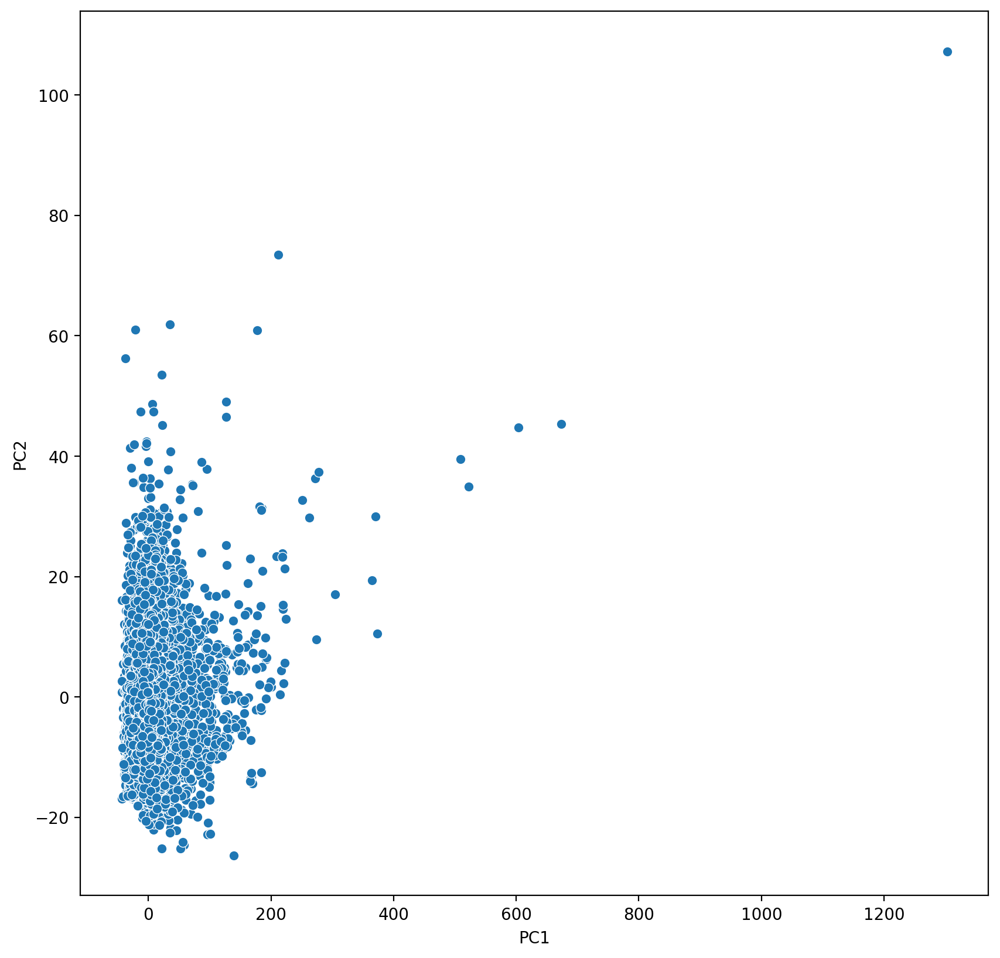

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
sns.scatterplot(data=df, x="PC1", y="PC2", palette="deep")

In [11]:
df.to_csv("all_compounds_116722_pca.csv.gz", index=False, compression="gzip")

In [15]:
from MulticoreTSNE import MulticoreTSNE
import numpy as np
import matplotlib.pyplot as plt

# Create the t-SNE instance
tsne = MulticoreTSNE(n_components=2 , verbose=2, n_jobs=-1)  # n_jobs is the number of cores you want to use

# Perform t-SNE dimensionality reduction
tsne_res = tsne.fit_transform(features_Std)

tsne_df = pd.DataFrame(data=tsne_res, columns=['tsne_1', 'tsne_2'])

Performing t-SNE using 76 cores.
Using no_dims = 2, perplexity = 30.000000, and theta = 0.500000
Computing input similarities...
Building tree...
 - point 11672 of 116722
 - point 23344 of 116722
 - point 35016 of 116722
 - point 46688 of 116722
 - point 58360 of 116722
 - point 70032 of 116722
 - point 81704 of 116722
 - point 93377 of 116722
 - point 105048 of 116722
 - point 116720 of 116722
Done in 42.00 seconds (sparsity = 0.001216)!
Learning embedding...
Iteration 51: error is 125.579588 (50 iterations in 11.00 seconds)
Iteration 101: error is 125.555094 (50 iterations in 12.00 seconds)
Iteration 151: error is 123.868588 (50 iterations in 12.00 seconds)
Iteration 201: error is 119.350114 (50 iterations in 12.00 seconds)
Iteration 251: error is 116.561486 (50 iterations in 11.00 seconds)
Iteration 301: error is 6.133839 (50 iterations in 11.00 seconds)
Iteration 351: error is 5.780278 (50 iterations in 12.00 seconds)
Iteration 401: error is 5.580733 (50 iterations in 11.00 seconds

In [16]:
df['tsne_1'] = tsne_df['tsne_1'] 
df['tsne_2'] = tsne_df['tsne_2'] 
df

,Metadata_JCP2022,smiles,Standardized_SMILES,Standardized_InChI,PC1,PC2,tsne_1,tsne_2
0,JCP2022_000001,CCc1nccn1-c1cccc(C2CCCN2C(=O)c2ccc(OCCN(C)C)cc...,CCc1nccn1-c1cccc(C2CCC[NH+]2C(=O)c2ccc(OCC[NH+...,InChI=1S/C25H31N5O2/c1-4-23-26-14-16-30(23)24-...,15.576281,-6.958881,7.745776,10.736028
1,JCP2022_000002,OC1=NCCCN1Cc1ccc(Cl)cc1,O=C1NCCC[NH+]1Cc1ccc(Cl)cc1,InChI=1S/C11H13ClN2O/c12-10-4-2-9(3-5-10)8-14-...,-21.048427,-4.362332,-17.318649,-12.126565
2,JCP2022_000003,O=C1N=C(O)c2cc(Nc3ccccc3)c(Nc3ccccc3)cc21,O=C1NC(=O)c2cc(Nc3ccccc3)c(Nc3ccccc3)cc21,InChI=1S/C20H15N3O2/c24-19-15-11-17(21-13-7-3-...,-3.447232,2.026602,12.107072,-8.495122
3,JCP2022_000004,CCCn1nccc1S(=O)(=O)N1CC2CCC1CNC2,CCCn1nccc1S(=O)(=O)[NH+]1CC2CCC1C[NH2+]C2,InChI=1S/C13H22N4O2S/c1-2-7-16-13(5-6-15-16)20...,-5.914100,-5.725977,-11.697940,21.330408
4,JCP2022_000005,CCN=C(O)CC1N=C(c2ccc(Cl)cc2)c2cc(OC)ccc2-n2c(C...,CCNC(=O)CC1N=C(c2ccc(Cl)cc2)c2cc(OC)ccc2-n2c(C...,InChI=1S/C22H22ClN5O2/c1-4-24-20(29)12-18-22-2...,10.105129,1.414290,15.270850,3.305253
...,...,...,...,...,...,...,...,...
116717,JCP2022_116749,CN(C)c1ccc(O)c2c1CC1CC3C(N(C)C)C(=O)C(C(=N)O)C...,CN(C)c1ccc([O-])c2c1CC1CC3C([NH+](C)C)C(=O)C(C...,InChI=1S/C23H27N3O7/c1-25(2)12-5-6-13(27)15-10...,24.289985,2.064492,18.277757,7.871926
116718,JCP2022_116750,Cc1nc(C)c(CCC(=O)N(C2CC2)C2CCCc3ccccc32)c(O)n1,Cc1nc(=O)c(CCC(=O)[NH+](C2CC2)C2CCCc3ccccc32)c...,InChI=1S/C22H27N3O2/c1-14-18(22(27)24-15(2)23-...,5.690848,-6.697243,-11.878104,4.173623
116719,JCP2022_116751,Cn1ccc2ccn(CCN=C(O)c3cnc4ccccc4n3)c(=O)c21,Cn1ccc2ccn(CCNC(=O)c3cnc4ccccc4n3)c(=O)c21,InChI=1S/C19H17N5O2/c1-23-9-6-13-7-10-24(19(26...,-1.416001,0.779767,6.323047,-3.904755
116720,JCP2022_116752,Cc1nccc(-c2cccc(NS(=O)(=O)c3cc(C(F)(F)F)cc(C(F...,Cc1nccc(-c2cccc(NS(=O)(=O)c3cc(C(F)(F)F)cc(C(F...,InChI=1S/C19H13F6N3O2S/c1-11-26-6-5-17(27-11)1...,10.772873,22.926837,23.784110,-7.299365


<AxesSubplot:xlabel='tsne_1', ylabel='tsne_2'>

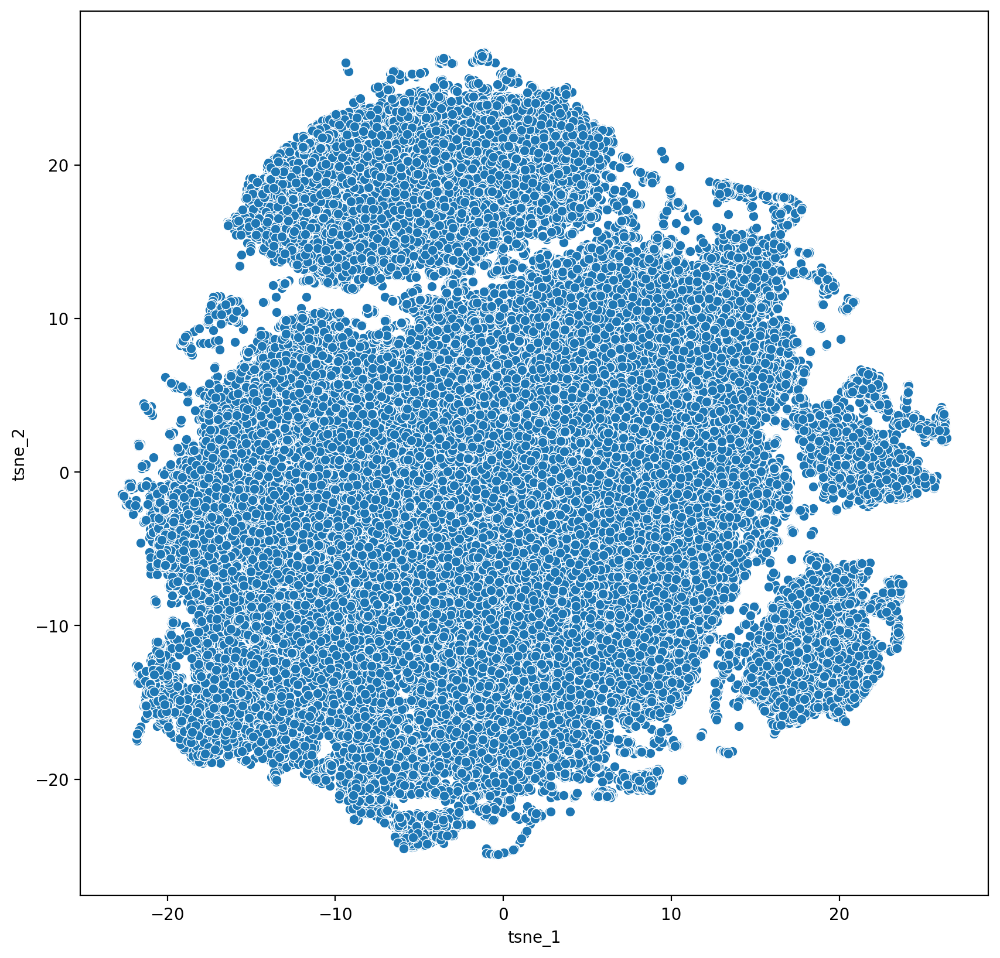

In [17]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
sns.scatterplot(data=df, x="tsne_1", y="tsne_2", palette="deep")

In [18]:
df.to_csv("all_compounds_116722_pca_tsne.csv.gz", index=False, compression="gzip")

In [19]:
df =pd.read_csv("all_compounds_116722_pca_tsne.csv.gz", compression="gzip")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


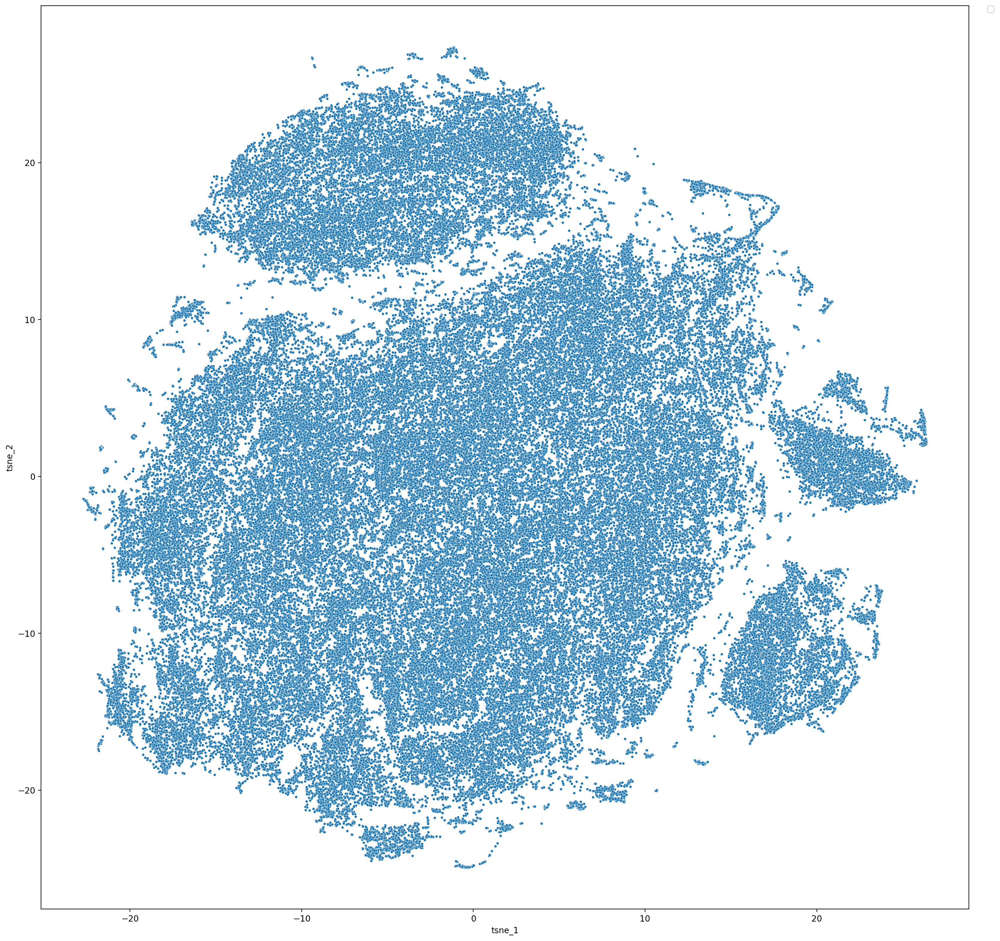

In [22]:
fig, ax = plt.subplots(figsize=(20, 20), dpi=200)
sns.scatterplot(data=df, x="tsne_1", y="tsne_2", s=10)
plt.title("")
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.show()

In [34]:
ATC_KEGG_processed = pd.read_csv("../data/KeggDrugVirtualScreening/ATC_KEGG_processed.csv.gz", compression="gzip")
ATC_KEGG_processed = ATC_KEGG_processed.drop_duplicates(subset="Standardized_SMILES", keep="first")
ATC_KEGG_processed = ATC_KEGG_processed.drop_duplicates(subset="Standardized_InChI", keep="first").reset_index(drop=True)
ATC_KEGG_processed["Space"] = "Drugs"
ATC_KEGG_processed

,SMILES,KEGG_code,CompoundName,BigGroup_ATC_class,ATC_label_class,Standardized_SMILES,Standardized_InChI,Space
0,[N@@H+](CCCCCCCCCCCCCCCCCC)(CCC[NH+](CCO)CCO)CCO,D05241,Olaflur (USAN/INN),ALIMENTARY TRACT AND METABOLISM,Caries prophylactic agents,CCCCCCCCCCCCCCCCCC[NH+](CCO)CCC[NH+](CCO)CCO,InChI=1S/C27H58N2O3/c1-2-3-4-5-6-7-8-9-10-11-1...,Drugs
1,[C@H]12[C@@H]([C@H](C[C@](O1)(C[C@H](C[C@H]([C...,D00203,Amphotericin B (JP17/USP/INN),ALIMENTARY TRACT AND METABOLISM,Antiinfectives and antiseptics for local oral...,CC1C=CC=CC=CC=CC=CC=CC=CC(OC2OC(C)C(O)C([NH3+]...,InChI=1S/C47H73NO17/c1-27-17-15-13-11-9-7-5-6-...,Drugs
2,c1ccc(cc1)OCC[N+](C)(C)CCCCCCCCCCCC,D01588,Domiphen bromide (JAN/USAN/INN),ALIMENTARY TRACT AND METABOLISM,Antiinfectives and antiseptics for local oral...,CCCCCCCCCCCC[N+](C)(C)CCOc1ccccc1,InChI=1S/C22H40NO/c1-4-5-6-7-8-9-10-11-12-16-1...,Drugs
3,c1ccc2c(c1O)nccc2,D05321,Oxyquinoline (USAN),ALIMENTARY TRACT AND METABOLISM,Antiinfectives and antiseptics for local oral...,[O-]c1cccc2cccnc12,InChI=1S/C9H7NO/c11-8-5-1-3-7-4-2-6-10-9(7)8/h...,Drugs
4,c1(cc(c(cc1)CO[C@@H](Cn1cncc1)c1c(cc(cc1)Cl)Cl...,D00416,Miconazole (JP17/USP/INN),ALIMENTARY TRACT AND METABOLISM,Antiinfectives and antiseptics for local oral...,Clc1ccc(COC(Cn2ccnc2)c2ccc(Cl)cc2Cl)c(Cl)c1,InChI=1S/C18H14Cl4N2O/c19-13-2-1-12(16(21)7-13...,Drugs
...,...,...,...,...,...,...,...,...
2311,O=C(C[N@H+](CC[NH+](CC(=O)O)CC(=O)O)CC[N@H+](C...,D02108,Indium In 111 pentetreotide (USP),VARIOUS,Indium (111In) compounds,CC(O)C(CO)NC(=O)C1CSSCC(NC(=O)C(Cc2ccccc2)NC(=...,InChI=1S/C63H87N13O19S2/c1-37(78)48(34-77)70-6...,Drugs
2312,[C@H]1([C@H]([C@@H]([C@H](O[C@@H]1O)CO)O)O)F,D01843,Fludeoxyglucose F 18 (USP),VARIOUS,Other diagnostic radiopharmaceuticals for tum...,OCC1OC(O)C(F)C(O)C1O,InChI=1S/C6H11FO5/c7-3-5(10)4(9)2(1-8)12-6(3)1...,Drugs
2313,c1c(c(cc(c1F)C[C@@H](C(=O)O)[NH3+])O)O,D04220,Fluorodopa F 18 (USP),VARIOUS,Other diagnostic radiopharmaceuticals for tum...,[NH3+]C(Cc1cc([O-])c([O-])cc1F)C(=O)[O-],InChI=1S/C9H10FNO4/c10-5-3-8(13)7(12)2-4(5)1-6...,Drugs
2314,[C@H]12[C@H]3[C@@H]([C@@]4(C(=CC3)C[C@H](CC4)O...,D04567,Iodocholesterol I 131 (USAN),VARIOUS,Iodine (131I) compounds,CC(C)CCCC(C)C1CCC2C3CC=C4CC(O)CCC4(CI)C3CCC12C,InChI=1S/C27H45IO/c1-18(2)6-5-7-19(3)23-10-11-...,Drugs


In [44]:
JUMP_drugs = df.merge(ATC_KEGG_processed, on="Standardized_SMILES", how="left")
JUMP_drugs['Space'] = JUMP_drugs['Space'].fillna('JUMP_Compounds')
JUMP_drugs

,Metadata_JCP2022,smiles,Standardized_SMILES,Standardized_InChI_x,PC1,PC2,tsne_1,tsne_2,SMILES,KEGG_code,CompoundName,BigGroup_ATC_class,ATC_label_class,Standardized_InChI_y,Space
0,JCP2022_000001,CCc1nccn1-c1cccc(C2CCCN2C(=O)c2ccc(OCCN(C)C)cc...,CCc1nccn1-c1cccc(C2CCC[NH+]2C(=O)c2ccc(OCC[NH+...,InChI=1S/C25H31N5O2/c1-4-23-26-14-16-30(23)24-...,15.576281,-6.958881,7.745776,10.736028,NaN,NaN,NaN,NaN,NaN,NaN,JUMP_Compounds
1,JCP2022_000002,OC1=NCCCN1Cc1ccc(Cl)cc1,O=C1NCCC[NH+]1Cc1ccc(Cl)cc1,InChI=1S/C11H13ClN2O/c12-10-4-2-9(3-5-10)8-14-...,-21.048427,-4.362332,-17.318649,-12.126565,NaN,NaN,NaN,NaN,NaN,NaN,JUMP_Compounds
2,JCP2022_000003,O=C1N=C(O)c2cc(Nc3ccccc3)c(Nc3ccccc3)cc21,O=C1NC(=O)c2cc(Nc3ccccc3)c(Nc3ccccc3)cc21,InChI=1S/C20H15N3O2/c24-19-15-11-17(21-13-7-3-...,-3.447232,2.026602,12.107072,-8.495122,NaN,NaN,NaN,NaN,NaN,NaN,JUMP_Compounds
3,JCP2022_000004,CCCn1nccc1S(=O)(=O)N1CC2CCC1CNC2,CCCn1nccc1S(=O)(=O)[NH+]1CC2CCC1C[NH2+]C2,InChI=1S/C13H22N4O2S/c1-2-7-16-13(5-6-15-16)20...,-5.914100,-5.725977,-11.697940,21.330408,NaN,NaN,NaN,NaN,NaN,NaN,JUMP_Compounds
4,JCP2022_000005,CCN=C(O)CC1N=C(c2ccc(Cl)cc2)c2cc(OC)ccc2-n2c(C...,CCNC(=O)CC1N=C(c2ccc(Cl)cc2)c2cc(OC)ccc2-n2c(C...,InChI=1S/C22H22ClN5O2/c1-4-24-20(29)12-18-22-2...,10.105129,1.414290,15.270850,3.305253,NaN,NaN,NaN,NaN,NaN,NaN,JUMP_Compounds
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116717,JCP2022_116749,CN(C)c1ccc(O)c2c1CC1CC3C(N(C)C)C(=O)C(C(=N)O)C...,CN(C)c1ccc([O-])c2c1CC1CC3C([NH+](C)C)C(=O)C(C...,InChI=1S/C23H27N3O7/c1-25(2)12-5-6-13(27)15-10...,24.289985,2.064492,18.277757,7.871926,[C@@H]12[C@](C(=C3[C@H](C2)Cc2c(C3=O)c(ccc2N(C...,D05045,Minocycline (USAN/INN),ALIMENTARY TRACT AND METABOLISM,Antiinfectives and antiseptics for local oral...,InChI=1S/C23H27N3O7/c1-25(2)12-5-6-13(27)15-10...,Drugs
116718,JCP2022_116750,Cc1nc(C)c(CCC(=O)N(C2CC2)C2CCCc3ccccc32)c(O)n1,Cc1nc(=O)c(CCC(=O)[NH+](C2CC2)C2CCCc3ccccc32)c...,InChI=1S/C22H27N3O2/c1-14-18(22(27)24-15(2)23-...,5.690848,-6.697243,-11.878104,4.173623,NaN,NaN,NaN,NaN,NaN,NaN,JUMP_Compounds
116719,JCP2022_116751,Cn1ccc2ccn(CCN=C(O)c3cnc4ccccc4n3)c(=O)c21,Cn1ccc2ccn(CCNC(=O)c3cnc4ccccc4n3)c(=O)c21,InChI=1S/C19H17N5O2/c1-23-9-6-13-7-10-24(19(26...,-1.416001,0.779767,6.323047,-3.904755,NaN,NaN,NaN,NaN,NaN,NaN,JUMP_Compounds
116720,JCP2022_116752,Cc1nccc(-c2cccc(NS(=O)(=O)c3cc(C(F)(F)F)cc(C(F...,Cc1nccc(-c2cccc(NS(=O)(=O)c3cc(C(F)(F)F)cc(C(F...,InChI=1S/C19H13F6N3O2S/c1-11-26-6-5-17(27-11)1...,10.772873,22.926837,23.784110,-7.299365,NaN,NaN,NaN,NaN,NaN,NaN,JUMP_Compounds


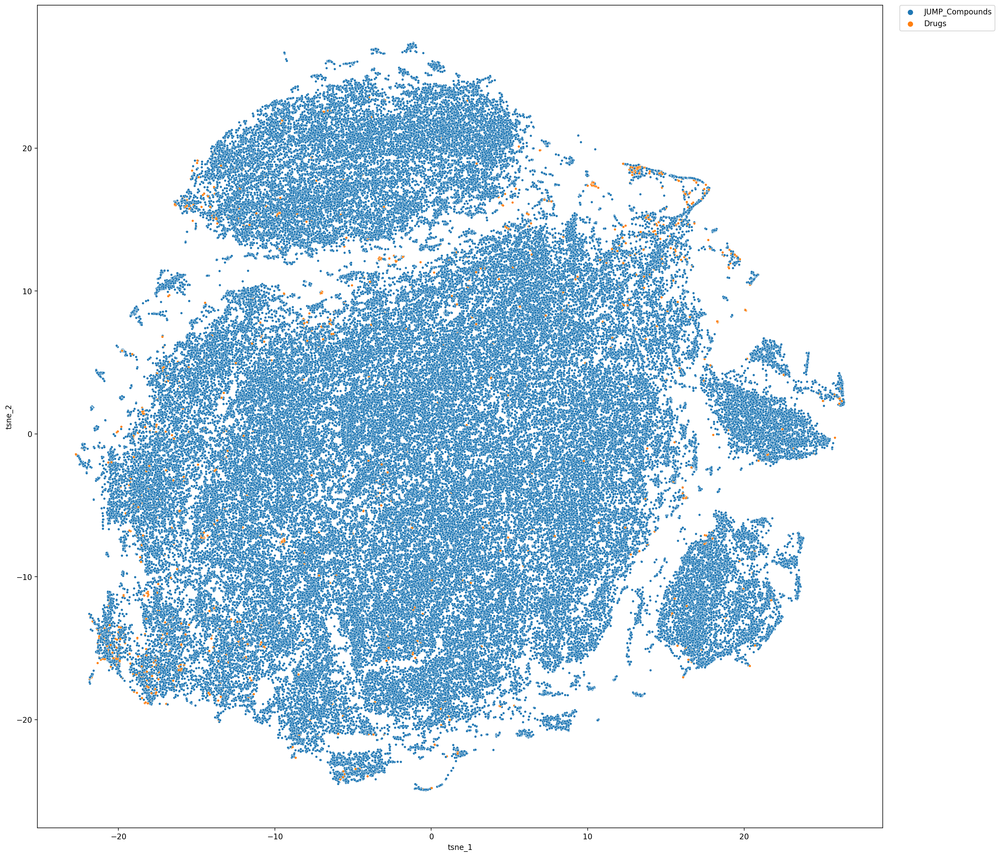

In [46]:
fig, ax = plt.subplots(figsize=(20, 20), dpi=200)
sns.scatterplot(data=JUMP_drugs, x="tsne_1", y="tsne_2", hue="Space", s=10)
plt.title("")
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.show()